# Customer Lifetime Value: Modeling Customer Profile for Underwriting Optimization
### The goal of this project is to create a model that predicts the customer lifetime values (CLV) of a given customer profile for auto insurance underwriting. 

## Load the data set and import libraries

In [1]:
## import pandas, numpy, and matplotlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

import statsmodels.api as sm
import itertools
#set plotting style
sns.set_style('whitegrid')

In [2]:
clv_df = pd.read_csv(
    'https://raw.githubusercontent.com/brisamh/modeling_clv/refs/heads/main/data/WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv')

## Exploratory Data Analysis

### Data Quality Observations:

1. No missing data since there are 9134 non-null inputs for all variables.  
2. There are 24 columns with different data types and 9134 rows for each column
3. Effective to date is of object type

In [3]:
clv_df.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,...,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,...,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,...,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,...,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,...,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,...,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [4]:
clv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   Customer Lifetime Value        9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location Code                  9134 non-null   object 
 11  Marital Status                 9134 non-null   object 
 12  Monthly Premium Auto           9134 non-null   i

#### Change data types, names, and formats

Change Effective to Date to date format

In [5]:
clv_df['Effective To Date'] = pd.to_datetime(clv_df['Effective To Date'])

C:\Users\njeng\AppData\Local\Temp\ipykernel_28232\3612925696.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  clv_df['Effective To Date'] = pd.to_datetime(clv_df['Effective To Date'])


Change column names to snake case lower

In [6]:
clv_df.columns = clv_df.columns.str.replace(' ', '_')
clv_df.columns =clv_df.columns.str.lower()


In [7]:
pd.set_option('display.max_columns', None)
clv_df.head()

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2011-02-24,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,2011-01-31,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2011-02-19,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,2011-01-20,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2011-02-03,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


Change the column names for clarity

In [8]:
clv_df = clv_df.rename(columns={'response': 'customer_response_to_offer','employmentstatus':'employment_status','effective_to_date':'policy_expiration_date'})

In [9]:
clv_df.head()

,customer,state,customer_lifetime_value,customer_response_to_offer,coverage,education,policy_expiration_date,employment_status,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2011-02-24,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,2011-01-31,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2011-02-19,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,2011-01-20,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2011-02-03,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


Check for duplicate records:

In [10]:
clv_df.duplicated().sum()

np.int64(0)

### Analyze Categorical Columns:
Explore the various category labels and proportion of data in each

In [11]:
cat_cols = clv_df.select_dtypes(include='object').columns
cat_cols = cat_cols.drop('customer')
print(cat_cols)

Index(['state', 'customer_response_to_offer', 'coverage', 'education',
       'employment_status', 'gender', 'location_code', 'marital_status',
       'policy_type', 'policy', 'renew_offer_type', 'sales_channel',
       'vehicle_class', 'vehicle_size'],
      dtype='object')


#### Analyze CLV by Category

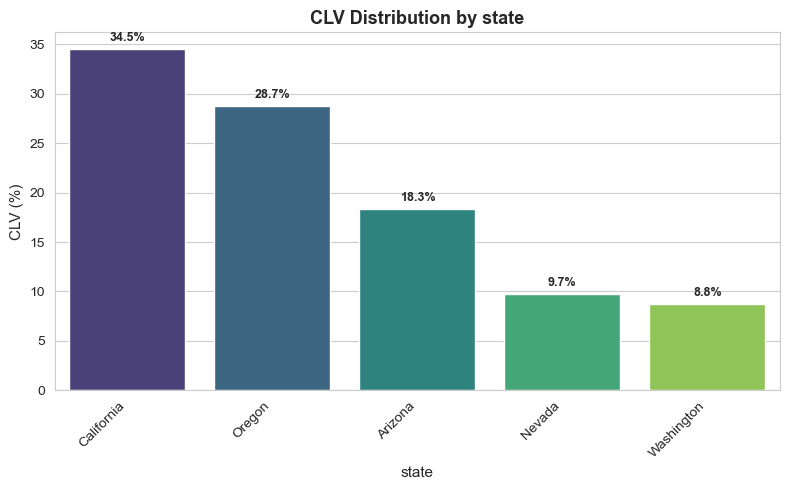

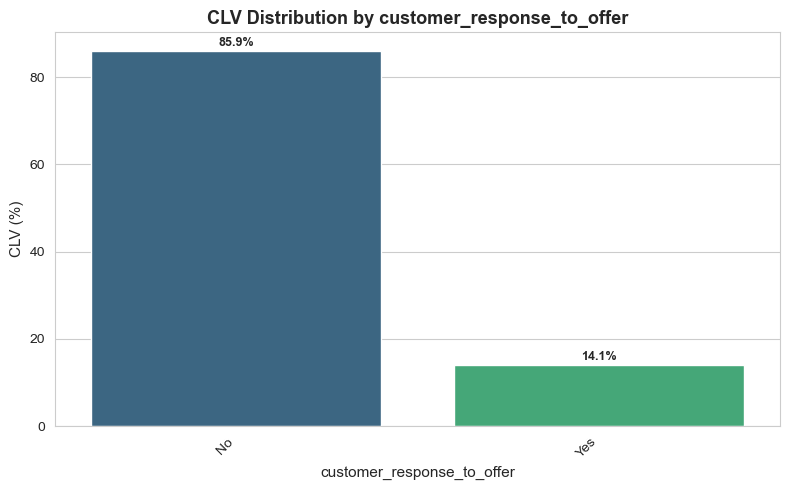

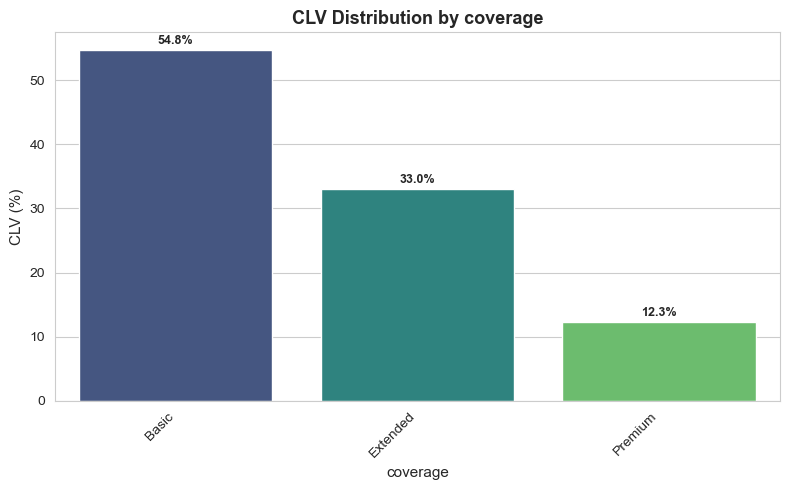

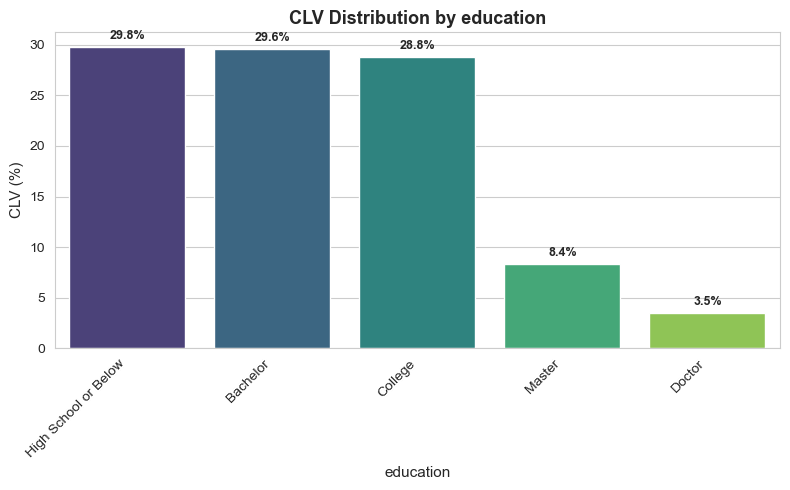

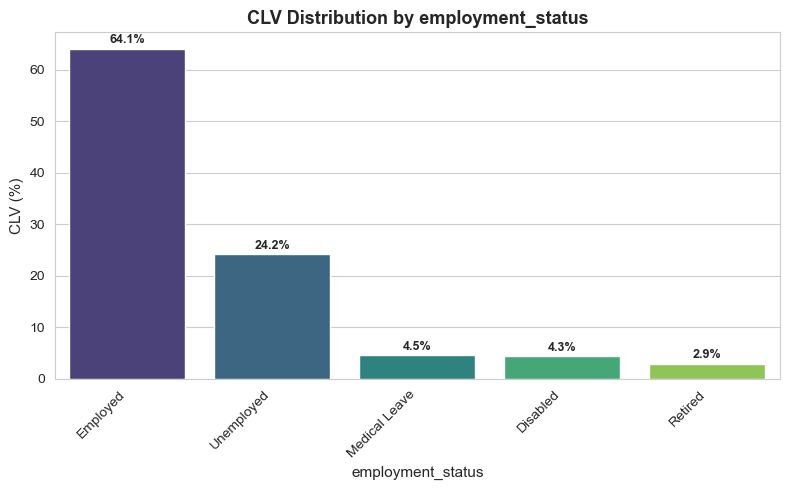

...

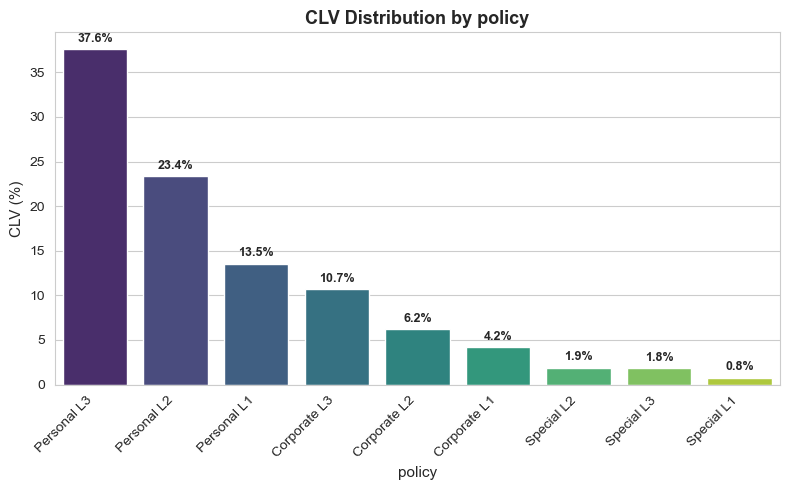

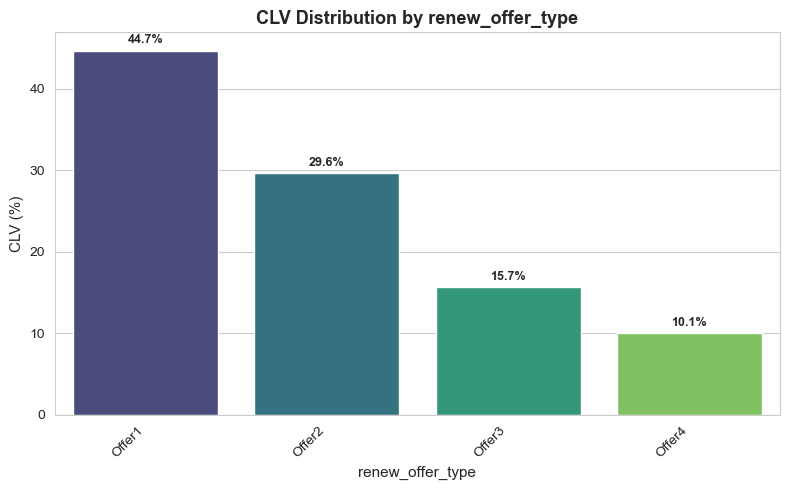

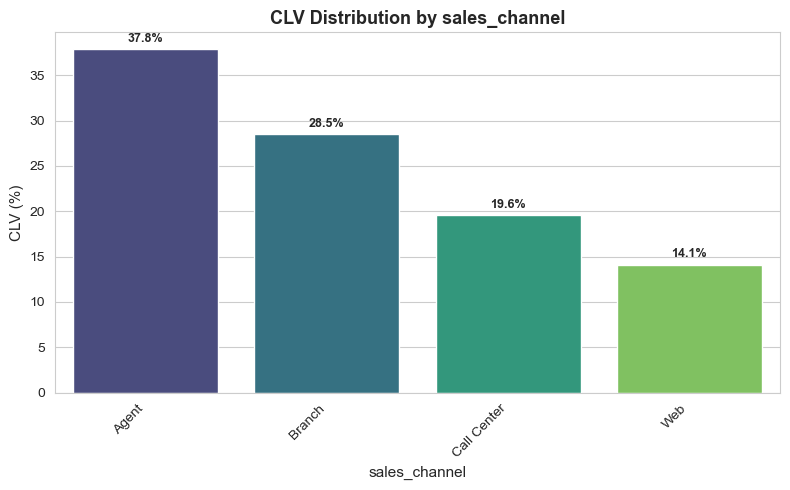

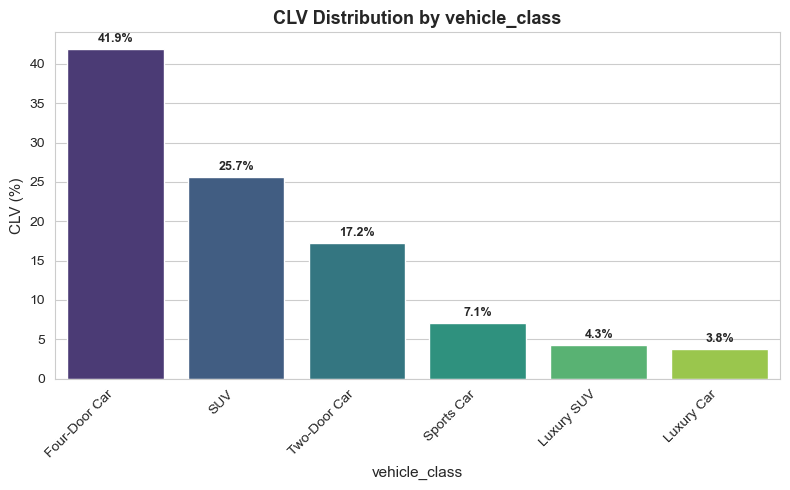

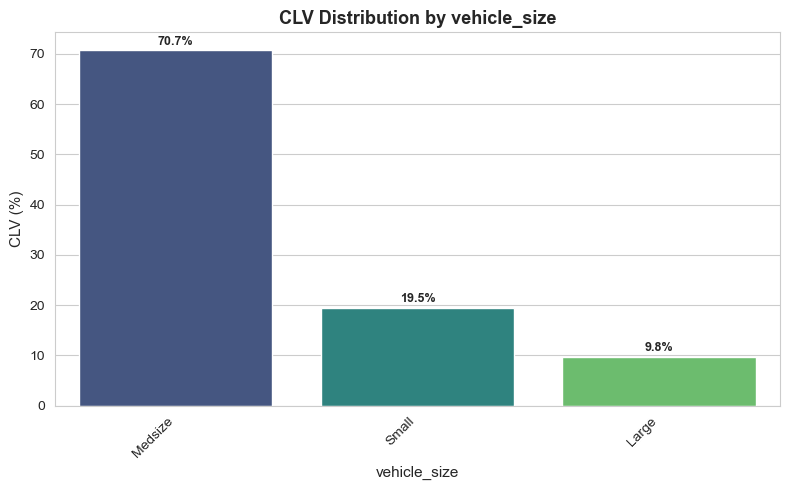

In [12]:
for col in cat_cols:
    plt.figure(figsize=(8, 5))

    # Aggregate CLV by category (sum)
    aggData = (
        clv_df.groupby(col)['customer_lifetime_value']
        .sum()
        .reset_index()
        .rename(columns={'customer_lifetime_value': 'Total_CLV'})
    )

    # Compute category-wise percentage share
    aggData['CLV_percent'] = (aggData['Total_CLV'] / aggData['Total_CLV'].sum()) * 100
    aggData = aggData.sort_values('CLV_percent', ascending=False)

    # Plot
    ax = sns.barplot(
        data=aggData,
        x=col,
        y='CLV_percent',
        palette='viridis',
        hue=col,
        legend=False
    )

    # Add text labels on bars
    for p in ax.patches:
        ax.text(
            p.get_x() + p.get_width() / 2,       # center of bar
            p.get_height() + 0.5,                # slightly above bar
            f"{p.get_height():.1f}%",            # label
            ha='center', va='bottom', fontsize=9, weight='bold'
        )

    # Formatting
    plt.title(f"CLV Distribution by {col}", fontsize=13, weight='bold')
    plt.xlabel(col, fontsize=11)
    plt.ylabel("CLV (%)", fontsize=11)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


#### Key Findings:
* State: California and Oregon dominate customer value, together contributing ~63% of total CLV.
* Coverage: Basic coverage plans dominate the customer base; Premium plans are niche but higher value.
* Education: Most CLV comes from customers with High School or Bachelor degrees; Masters and Doctorates contribute less.
* Employment Status: Employed customers contribute the majority of CLV, reflecting the link between employment stability and profitability.
* Marital Status: Married customers account for nearly 60% of total CLV.
* Policy Type: Personal policies, particularly L2 and L3 levels, generate most of the CLV; Corporate and Special policies contribute less.
* Renewal Offer Type: CLV is concentrated among Offer 1 and Offer 2 customers.
* Sales Channel: Agent and branch channels drive the majority of CLV, highlighting the importance of personal interaction.
* Vehicle Class & Size: Standard vehicles (four-door cars and SUVs) and mid-sized vehicles contribute most to CLV.
* Gender: Minimal variation; gender does not significantly influence CLV.

#### Average CLV by Category

In [13]:
for col in cat_cols:
    avg_clv = clv_df.groupby(col)['customer_lifetime_value'].mean().sort_values(ascending=False)
    print(f"\nAverage Customer Lifetime Value by {col}:")
    print(avg_clv)


Average Customer Lifetime Value by state:
state
Oregon        8077.901191
Nevada        8056.706839
Washington    8021.472273
California    8003.647758
Arizona       7861.341489
Name: customer_lifetime_value, dtype: float64

Average Customer Lifetime Value by customer_response_to_offer:
customer_response_to_offer
No     8030.022305
Yes    7854.871361
Name: customer_lifetime_value, dtype: float64

Average Customer Lifetime Value by coverage:
coverage
Premium     10895.603083
Extended     8789.677608
Basic        7190.706422
Name: customer_lifetime_value, dtype: float64

Average Customer Lifetime Value by education:
education
High School or Below    8296.709033
Master                  8243.484692
Bachelor                7872.660412
College                 7851.064644
Doctor                  7520.344837
Name: customer_lifetime_value, dtype: float64

Average Customer Lifetime Value by employment_status:
employment_status
Employed         8219.117754
Disabled         7847.889354
Medical Le

#### Key Findings
* State: Oregon, Nevada, Washington, and Arizona have similar average CLV contributions.
* Coverage: Premium coverage has the highest average CLV, but Basic coverage accounts for the majority of customers.
* Education: Customers with High School or Master’s education have the highest average CLV, though Master’s-level customers are a smaller proportion of the sample.
* Employment Status: Employed customers contribute the highest average CLV.
* Marital Status: Divorced customers have the highest average CLV, but Married customers represent the largest share of total CLV.
* Policy Type / Level: Special Auto and Special L3 / Corporate L1 policies have higher average CLV, even though Personal Auto and Personal L2 / L3 policies are more common.
* Renewal Offer Type: Offer 1 customers exhibit the highest average CLV.
* Vehicle Class: Luxury SUVs and Luxury Cars have the highest average CLV, but four-door cars contribute the most overall due to larger numbers.

### Analyze Numerical Columns:

Explore the distributions of the numerical columns

In [14]:
num_cols = clv_df.select_dtypes(include='number').columns
num_cols

Index(['customer_lifetime_value', 'income', 'monthly_premium_auto',
       'months_since_last_claim', 'months_since_policy_inception',
       'number_of_open_complaints', 'number_of_policies',
       'total_claim_amount'],
      dtype='object')

In [15]:
clv_df.describe(include=[np.number])

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
count,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000,9134.000000
mean,8004.940475,37657.380009,93.219291,15.097000,48.064594,0.384388,2.966170,434.088794
std,6870.967608,30379.904734,34.407967,10.073257,27.905991,0.910384,2.390182,290.500092
min,1898.007675,0.000000,61.000000,0.000000,0.000000,0.000000,1.000000,0.099007
25%,3994.251794,0.000000,68.000000,6.000000,24.000000,0.000000,1.000000,272.258244
50%,5780.182197,33889.500000,83.000000,14.000000,48.000000,0.000000,2.000000,383.945434
75%,8962.167041,62320.000000,109.000000,23.000000,71.000000,0.000000,4.000000,547.514839
max,83325.381190,99981.000000,298.000000,35.000000,99.000000,5.000000,9.000000,2893.239678


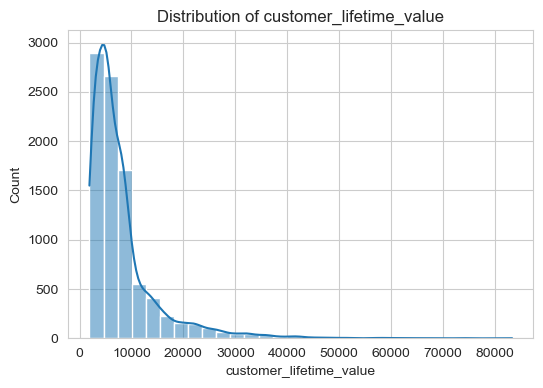

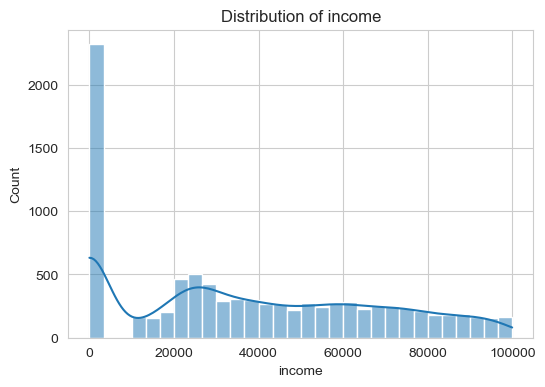

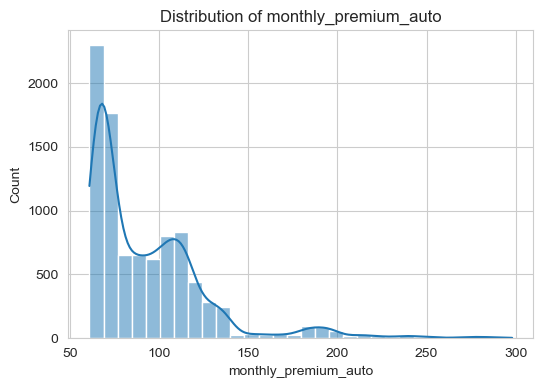

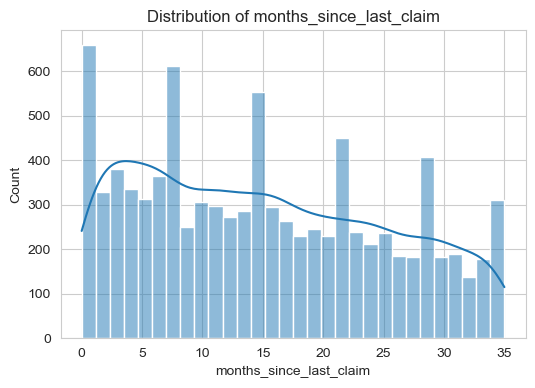

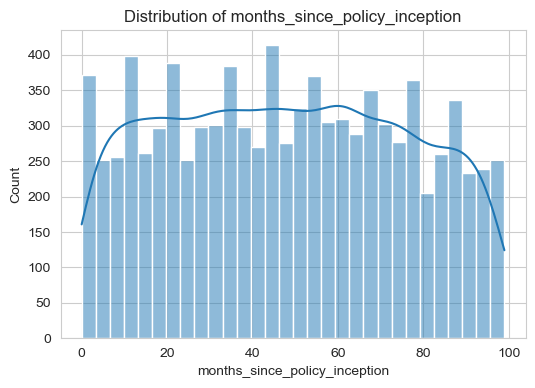

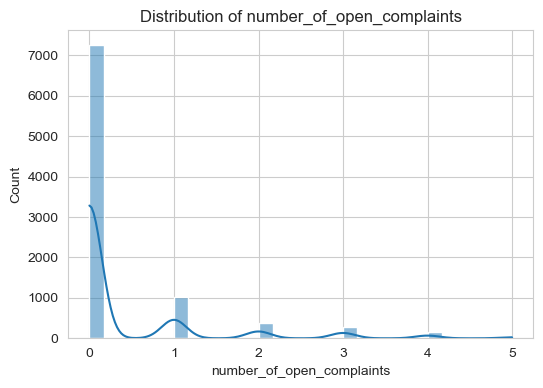

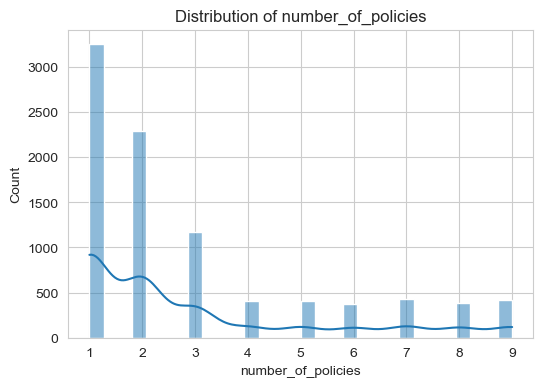

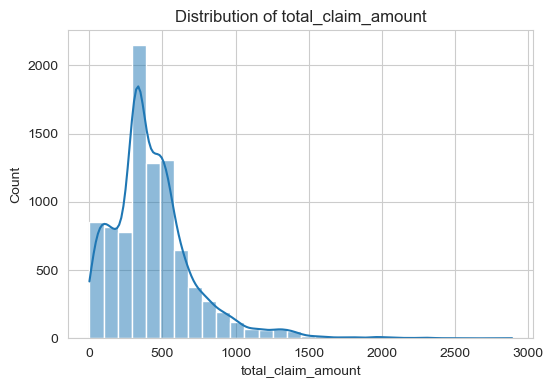

In [16]:
for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(clv_df[col], bins=30, kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

#### Key Findings:
* CLV: Strong right-skew with extreme outliers.
* Income: Many zero values; includes ~2,300 unemployed customers.
* Number of Policies: Right-skewed; most customers have 1–2 policies.
* Monthly Auto Premium: Right-skewed; majority of customers pay $60–$70.
* Total Claim Amount: Right-skewed with outliers; most claims are under $500.

Confirm the key findings by with box plots of our numerical data to view outliers and 5 number summaries:


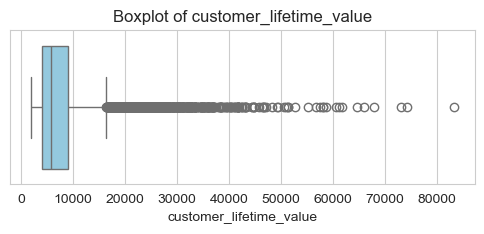

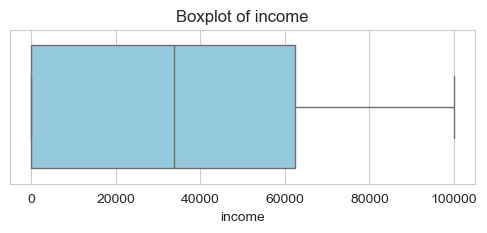

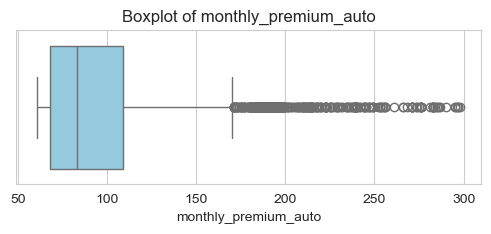

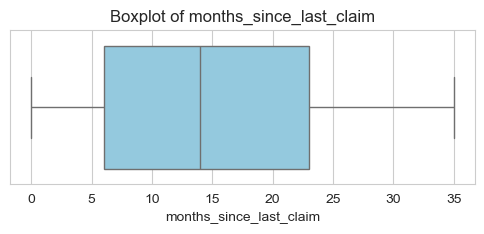

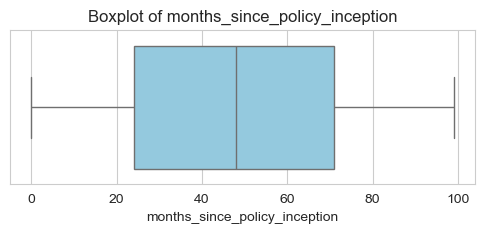

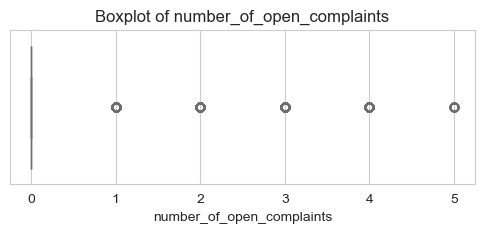

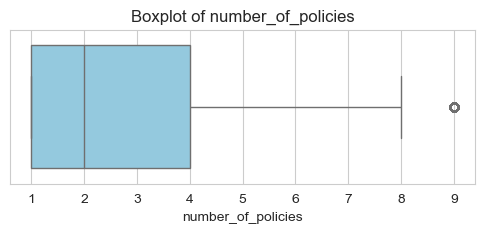

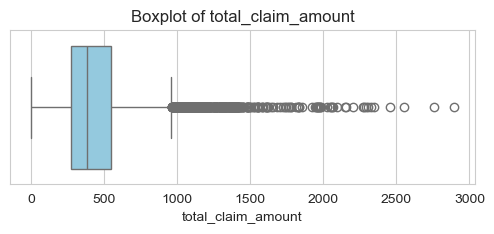

In [17]:
for col in num_cols:
    plt.figure(figsize=(6, 2))
    sns.boxplot(x=clv_df[col], color='skyblue')
    plt.title(f'Boxplot of {col}')
    plt.show()

### Analyzing Relationships Between Variables

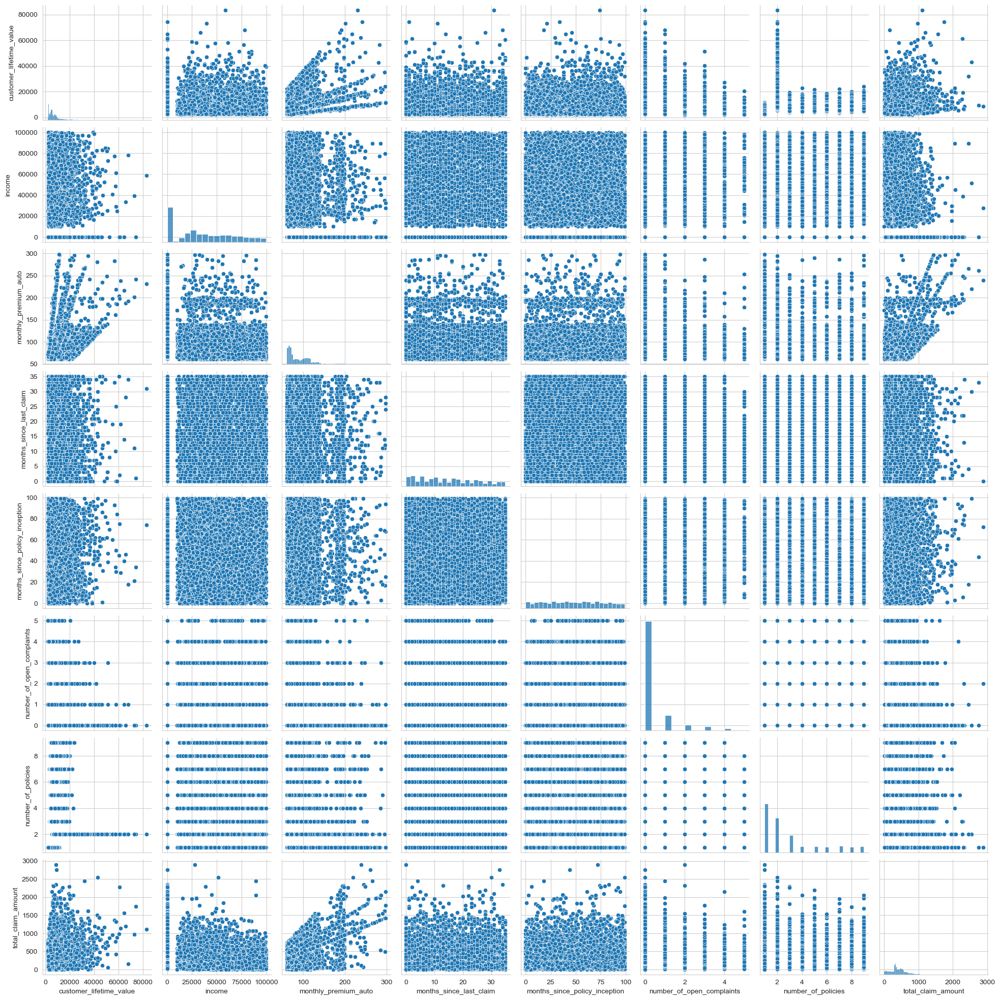

In [18]:
sns.pairplot(clv_df[num_cols]);
plt.show()

Many discrete but numeric data make it hard to see any meaningful relationships. Some stripping is present in Monthly Premium Auto and Total Claim Amount. We can visualize the relationships with categorical data using color:

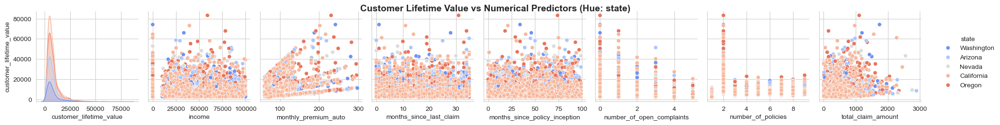

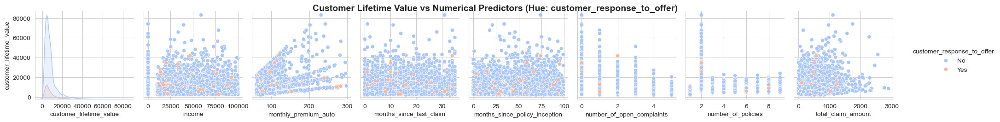

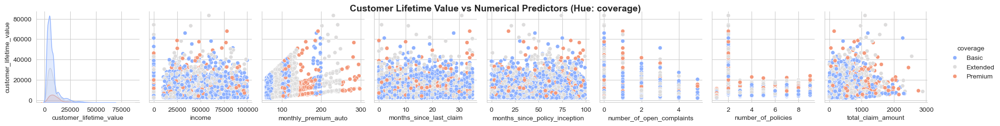

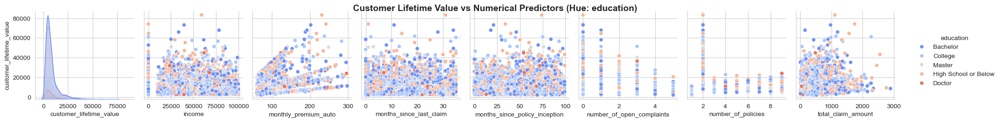

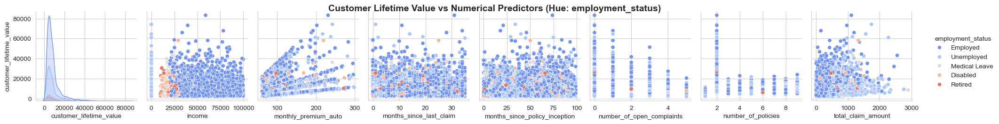

...

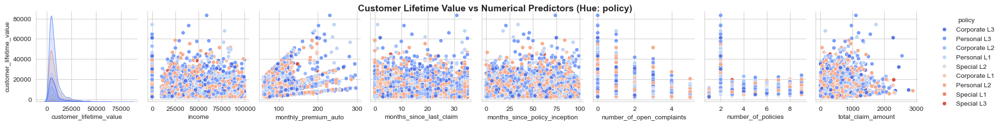

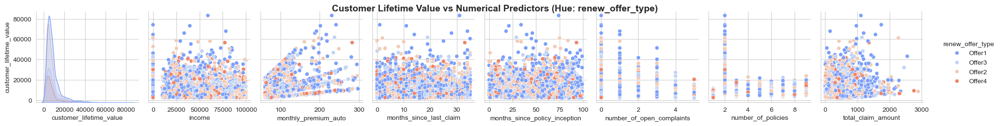

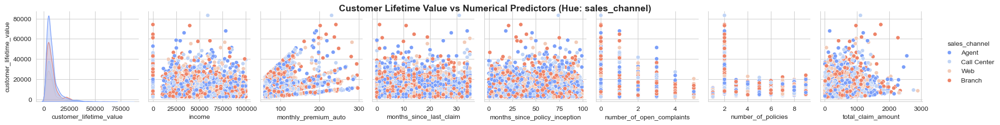

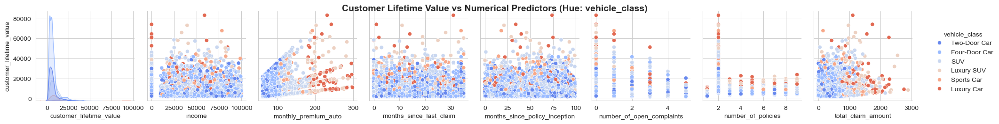

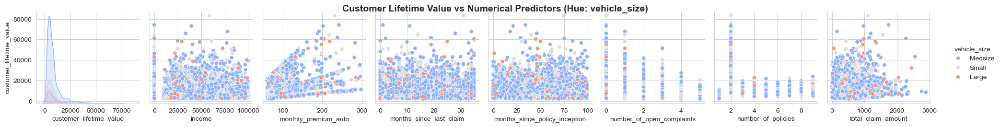

In [19]:
for hue_col in cat_cols:
    fig = sns.pairplot(
        data=clv_df,
        y_vars=['customer_lifetime_value'],
        kind='scatter',
        hue=hue_col,
        palette='coolwarm'
    )
    fig.fig.suptitle(f'Customer Lifetime Value vs Numerical Predictors (Hue: {hue_col})', 
                     y=1.02, fontsize=14, weight='bold')
    plt.show()

None of the categorical variables seem to explain the 'stripes' we see in Monthly Premium very well. These 'stripes' may actually come from one of the discrete numeric data types, like number of policies or number of open complaints. We do see that Vehicle Class and Coverage have a very distinct range of Monthly Premium, but do not explain the stripes. Below we will the pair plot without any category mapping:

<function matplotlib.pyplot.show(close=None, block=None)>

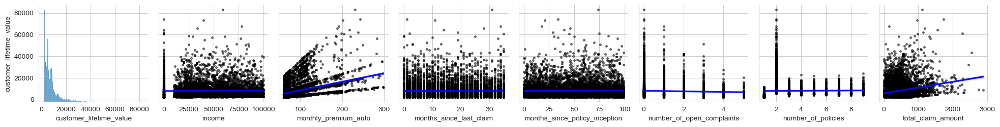

In [20]:
fig = sns.pairplot(
    clv_df[num_cols]
    ,y_vars=['customer_lifetime_value']
    ,kind='reg' ## regression 
    ,plot_kws={
        "line_kws":{'color':'blue'},
        "scatter_kws":{"alpha":0.5,"color":"k","s":7},
        },
)
 
plt.show

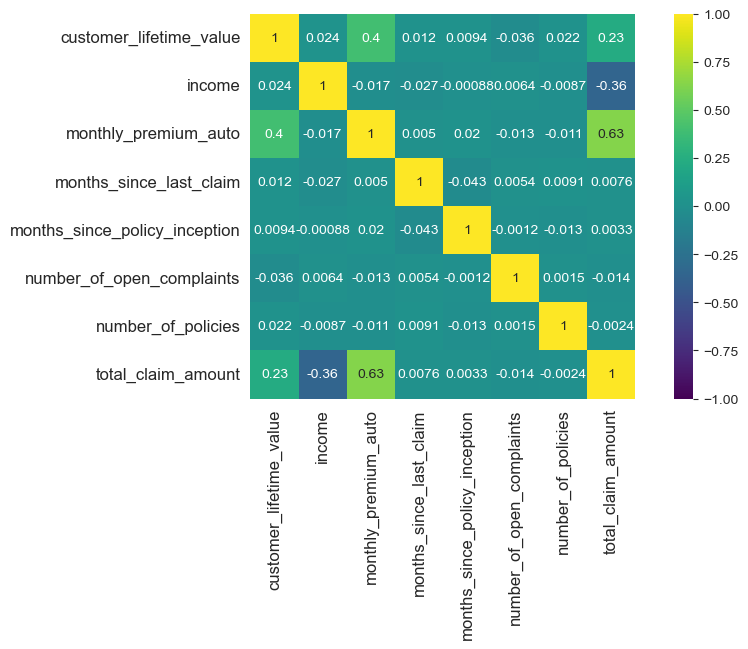

In [21]:
corr_matrix = clv_df[num_cols].corr()

plt.figure(figsize=(10, 5))
sns.heatmap(
    corr_matrix,
    vmax=1, vmin=-1,
    square=True,
    annot=True,
    cmap="viridis"
)
plt.tick_params(labelsize=12)
plt.show()

#### CLV vs Numerical Predictors

* Income: Slight positive trend; higher-income customers tend to have slightly higher CLV, but mostly a cloud of points. 
* Monthly Premium Auto: Clear positive relationship; customers paying higher premiums generally have higher CLV. Moderate correlation of 0.4.
* Months Since Last Claim: No apparent relationship.
* Months Since Policy Inception: No apparent relationship.
* Total Claim Amount: Slight positive relationship with CLV. Weak correlation of 0.23

Overall Insight: No strong patterns are evident; most numerical predictors show weak or minimal relationships with CLV, except for monthly auto premium.

### Identifying Interactions

Use a facet grid to scan for likely interaction terms:

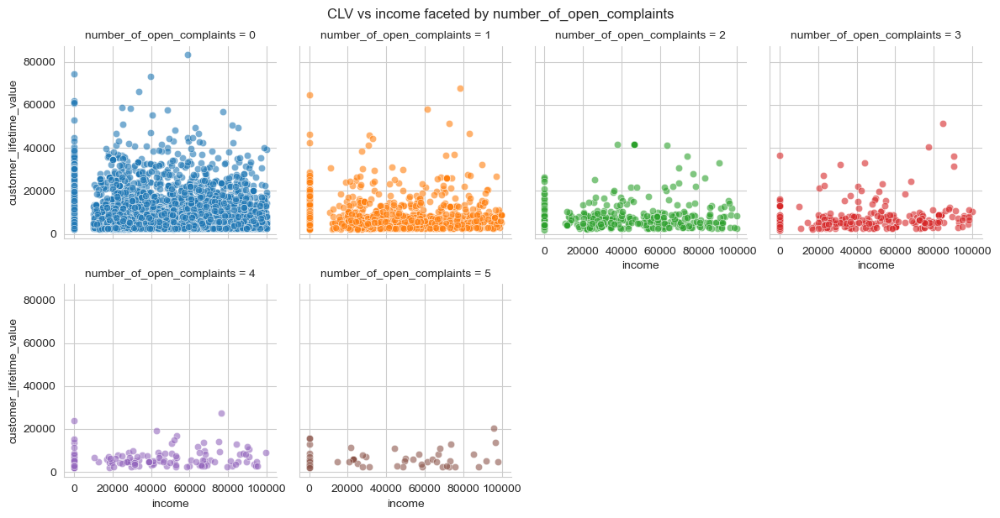

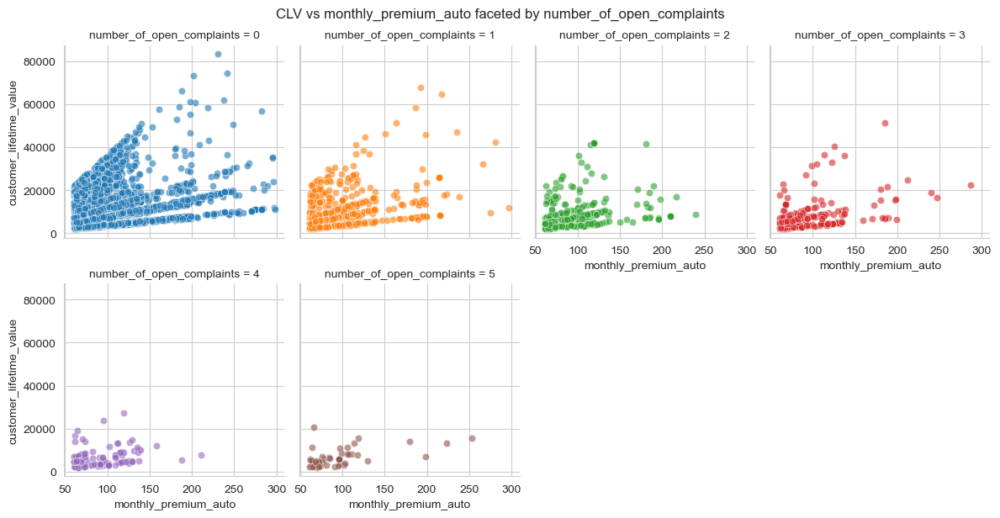

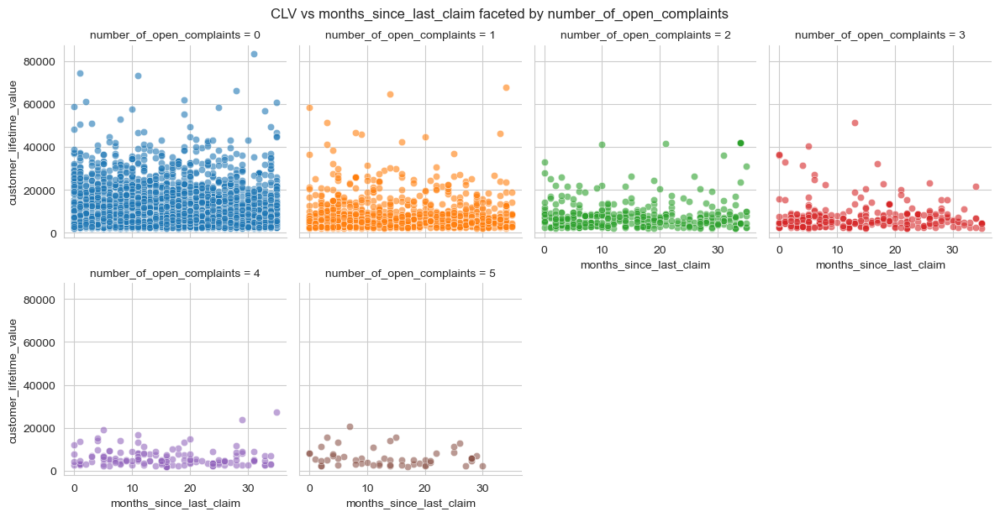

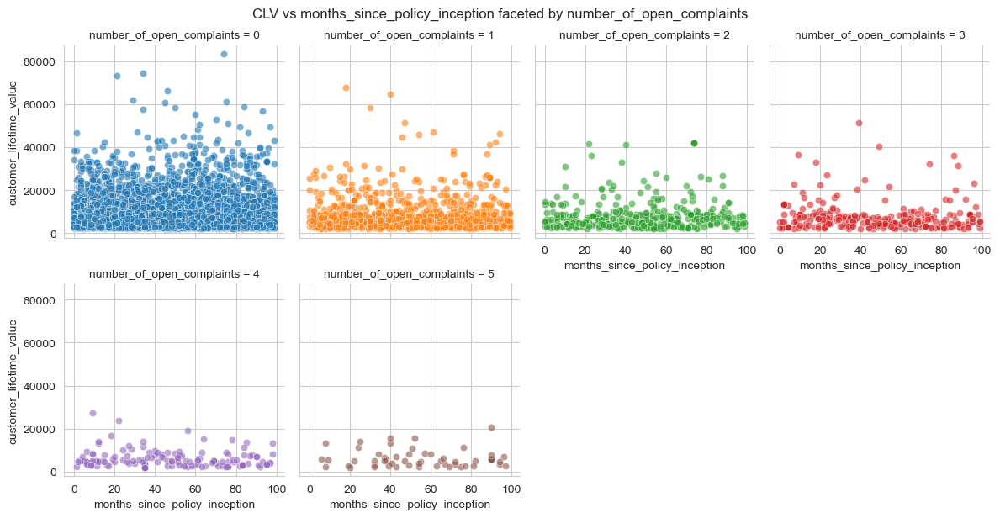

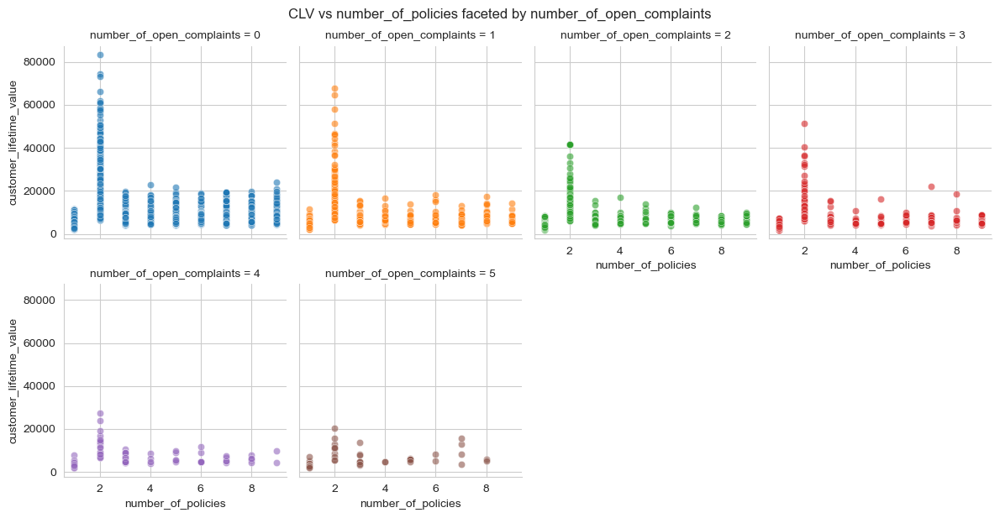

...

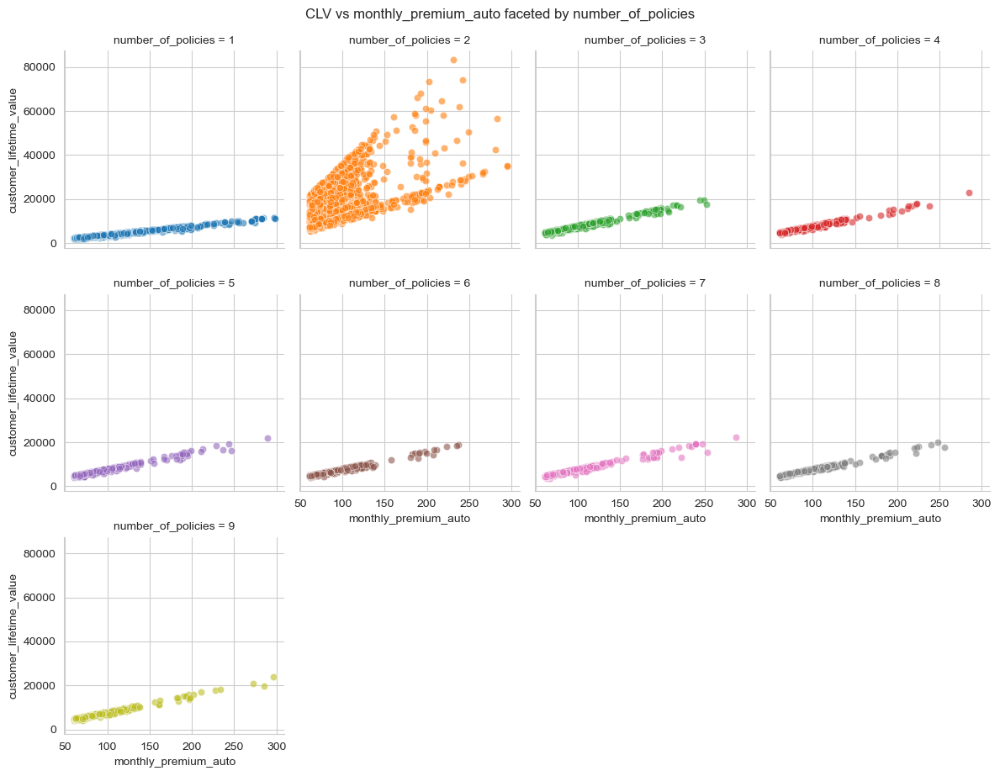

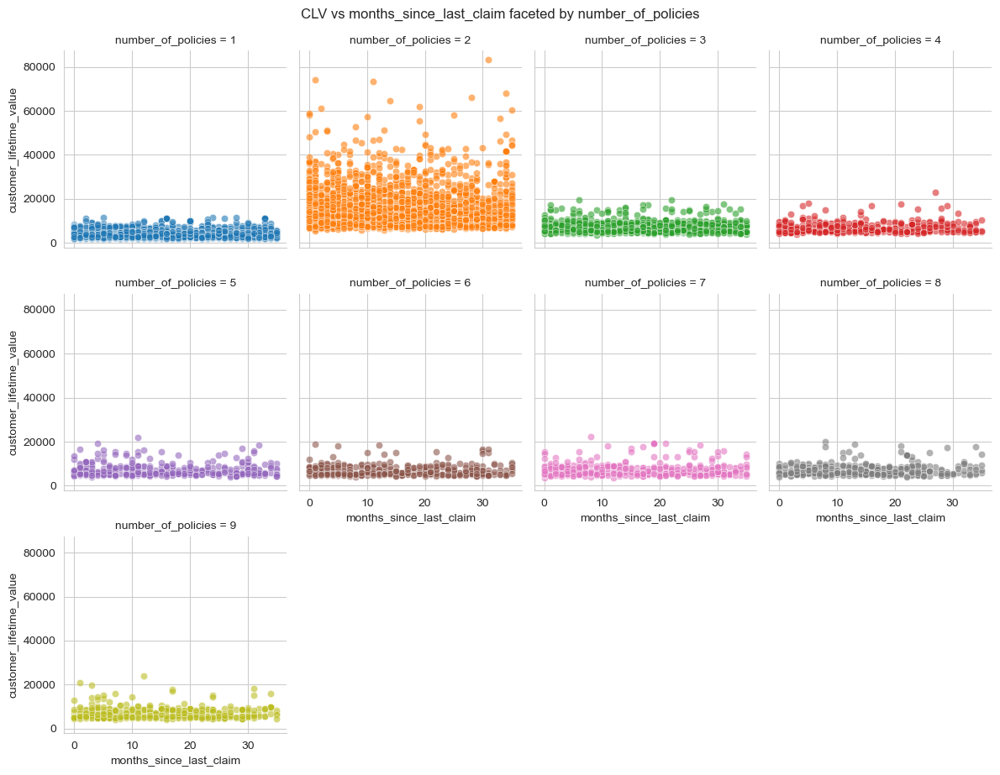

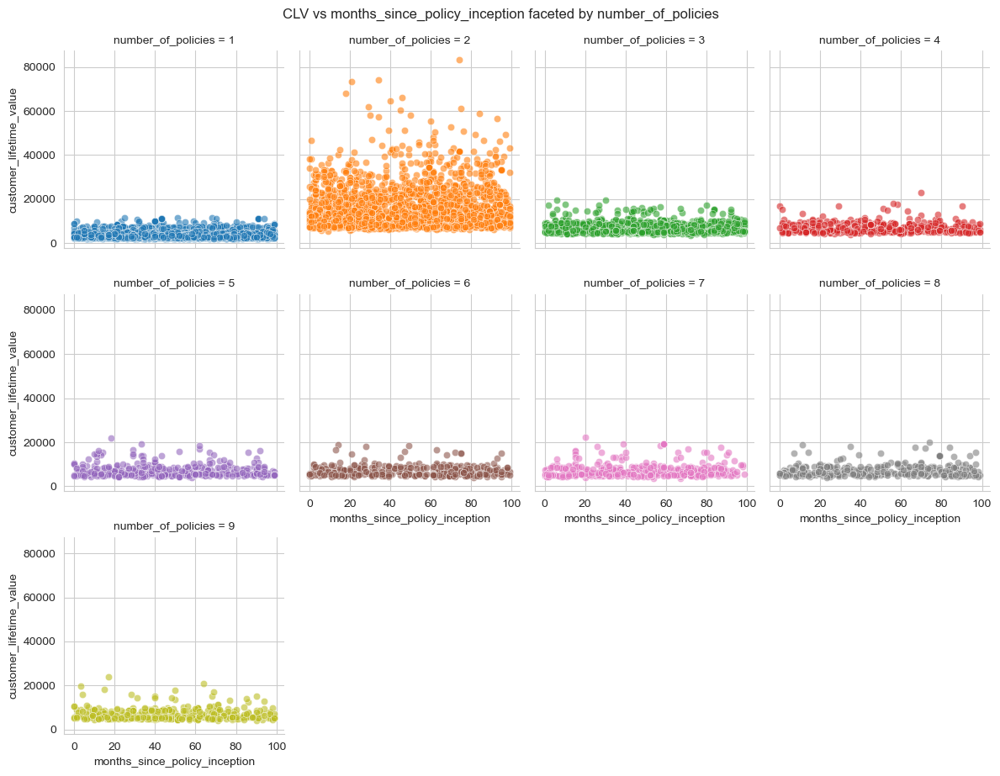

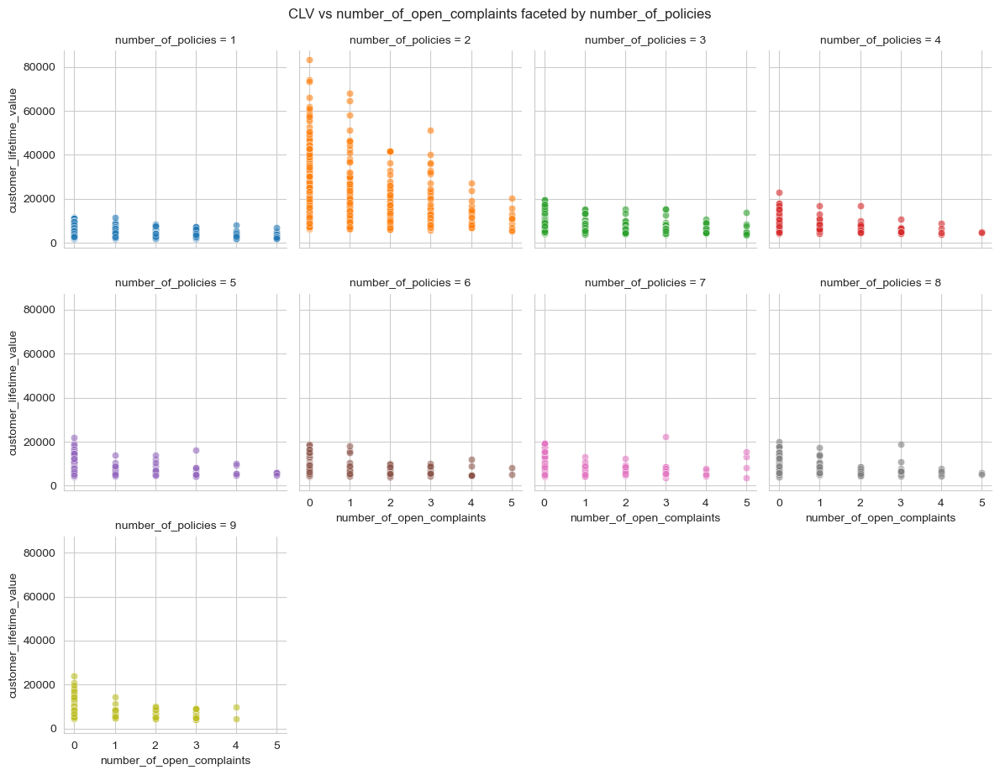

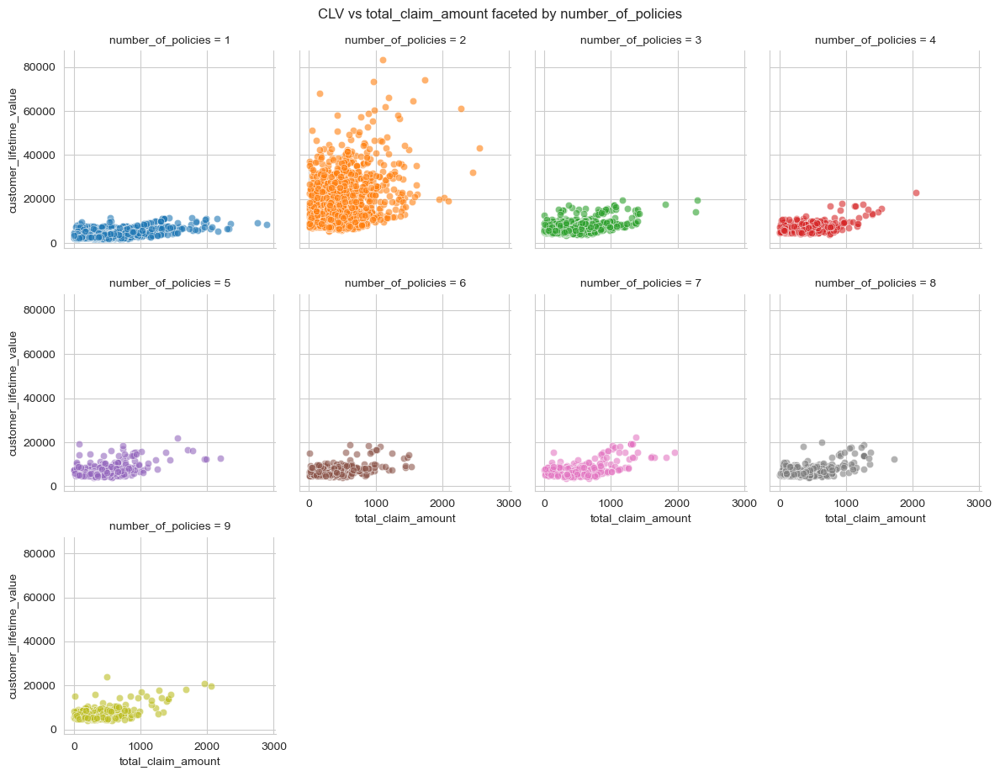

In [22]:
numeric_cols = clv_df.select_dtypes(include='number').columns.tolist()
numeric_cols.remove('customer_lifetime_value')  # target

## create facet grid, treaing columns with fewer than 10 unique values as categories
discrete_cols = [col for col in numeric_cols if clv_df[col].nunique() < 10]  

for discrete_col in discrete_cols:
    for cont_col in numeric_cols:
        if cont_col != discrete_col:
            g = sns.FacetGrid(clv_df, col=discrete_col, col_wrap=4,hue=discrete_col)
            g.map(sns.scatterplot, cont_col, 'customer_lifetime_value', alpha=0.6)
            g.fig.suptitle(f'CLV vs {cont_col} faceted by {discrete_col}', y=1.02)
            plt.show()

## Preprocessing Specific Policy Quantity DataFrames

There is a clear indication that when a customer has two policies, the data becomes much more unstable-- let's split the data by number of policies and see if that improves our relationships for a linear regression. Re-examining the spread of data for 1, 2, and 3 policies, beginning with the full CLV_DF:

In [23]:
clv_df['number_of_policies'].max()

9

In [24]:
clv_df_1pol = clv_df.loc[clv_df['number_of_policies'] == 1]
clv_df_2pol = clv_df.loc[clv_df['number_of_policies'] == 2]
clv_df_3pol = clv_df.loc[clv_df['number_of_policies'] == 3]
clv_df_4pol = clv_df.loc[clv_df['number_of_policies'] == 4]
clv_df_5pol = clv_df.loc[clv_df['number_of_policies'] == 5]
clv_df_6pol = clv_df.loc[clv_df['number_of_policies'] == 6]
clv_df_7pol = clv_df.loc[clv_df['number_of_policies'] == 7]
clv_df_8pol = clv_df.loc[clv_df['number_of_policies'] == 8]
clv_df_9pol = clv_df.loc[clv_df['number_of_policies'] == 9]

One policy:

<function matplotlib.pyplot.show(close=None, block=None)>

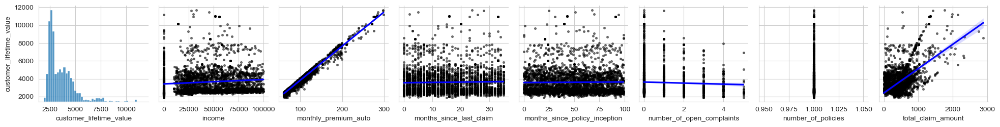

In [25]:
fig = sns.pairplot(
    clv_df_1pol[num_cols]
    ,y_vars=['customer_lifetime_value']
    ,kind='reg' ## regression 
    ,plot_kws={
        "line_kws":{'color':'blue'},
        "scatter_kws":{"alpha":0.5,"color":"k","s":7},
        },
)
 
plt.show

Two policies:

<function matplotlib.pyplot.show(close=None, block=None)>

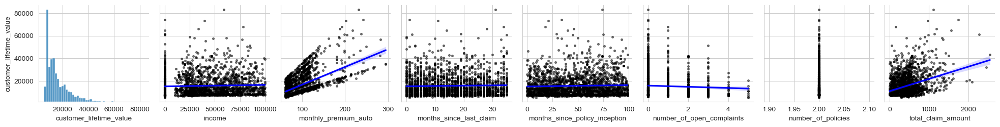

In [26]:
fig = sns.pairplot(
    clv_df_2pol[num_cols]
    ,y_vars=['customer_lifetime_value']
    ,kind='reg' ## regression 
    ,plot_kws={
        "line_kws":{'color':'blue'},
        "scatter_kws":{"alpha":0.5,"color":"k","s":7},
        },
)
 
plt.show

Three policies:

<function matplotlib.pyplot.show(close=None, block=None)>

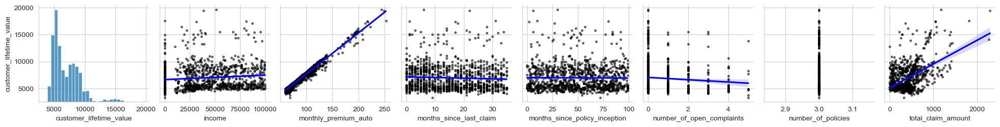

In [27]:
fig = sns.pairplot(
    clv_df_3pol[num_cols]
    ,y_vars=['customer_lifetime_value']
    ,kind='reg' ## regression 
    ,plot_kws={
        "line_kws":{'color':'blue'},
        "scatter_kws":{"alpha":0.5,"color":"k","s":7},
        },
)
 
plt.show

Monthly Premium and Total Claim Amount now have a much stronger visual correlation for 1 and 3 policies, but we still see some stripping for two policies

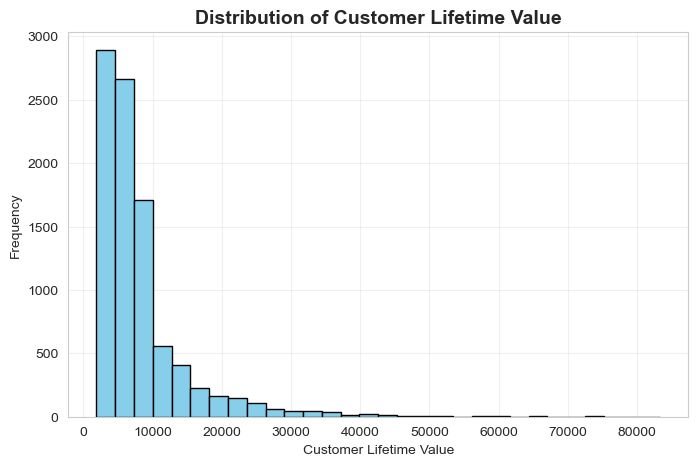

In [28]:
plt.figure(figsize=(8, 5))
plt.hist(clv_df['customer_lifetime_value'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Customer Lifetime Value', fontsize=14, weight='bold')
plt.xlabel('Customer Lifetime Value')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)
plt.show()

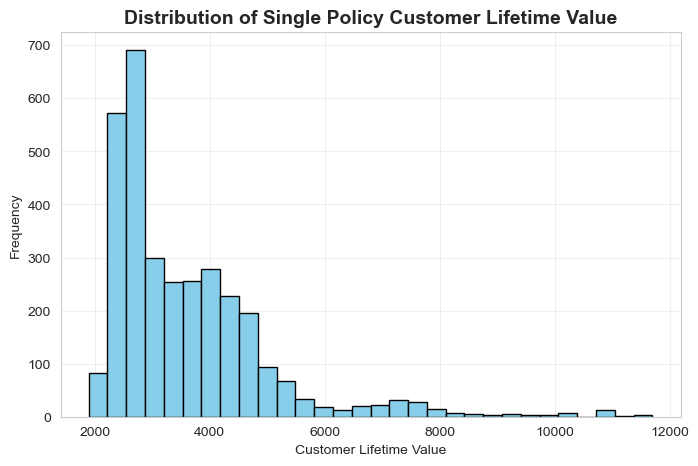

In [29]:
plt.figure(figsize=(8, 5))
plt.hist(clv_df_1pol['customer_lifetime_value'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Single Policy Customer Lifetime Value', fontsize=14, weight='bold')
plt.xlabel('Customer Lifetime Value')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)
plt.show()

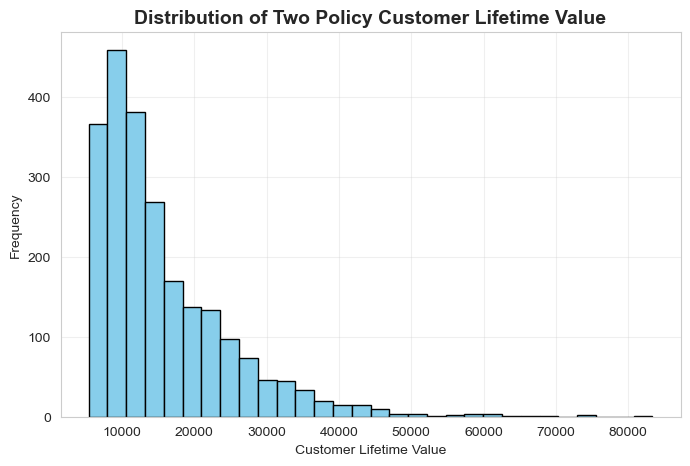

In [30]:
plt.figure(figsize=(8, 5))
plt.hist(clv_df_2pol['customer_lifetime_value'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Two Policy Customer Lifetime Value', fontsize=14, weight='bold')
plt.xlabel('Customer Lifetime Value')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)
plt.show()

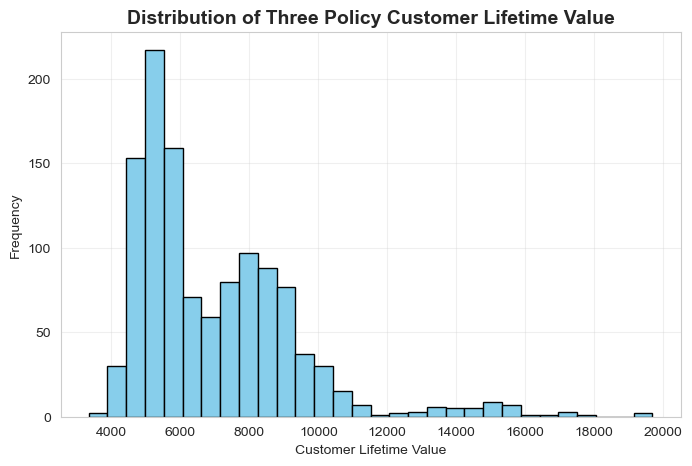

In [31]:
plt.figure(figsize=(8, 5))
plt.hist(clv_df_3pol['customer_lifetime_value'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Three Policy Customer Lifetime Value', fontsize=14, weight='bold')
plt.xlabel('Customer Lifetime Value')
plt.ylabel('Frequency')
plt.grid(alpha=0.3)
plt.show()

C:\Users\njeng\AppData\Local\Temp\ipykernel_28232\2192785438.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


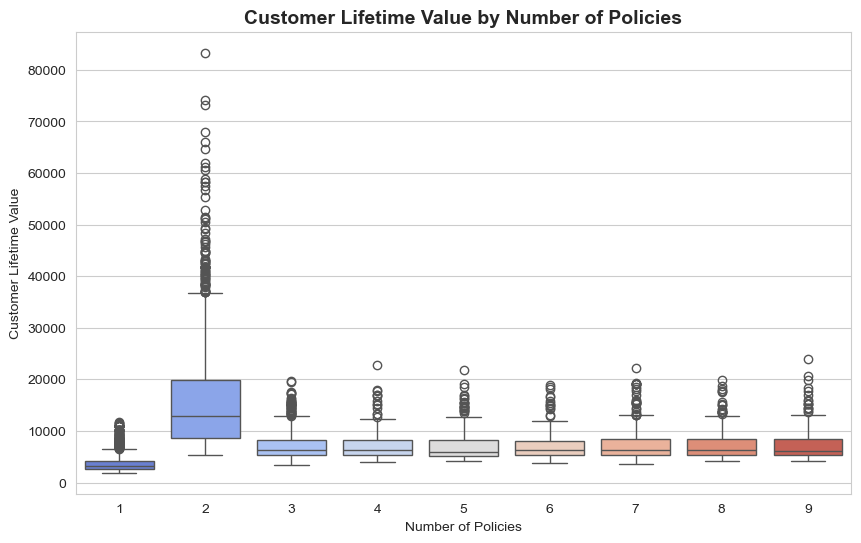

In [32]:
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=clv_df,
    x='number_of_policies',
    y='customer_lifetime_value',
    palette='coolwarm'
)

plt.title('Customer Lifetime Value by Number of Policies', fontsize=14, weight='bold')
plt.xlabel('Number of Policies')
plt.ylabel('Customer Lifetime Value')
plt.show()


In [33]:
clv_df.groupby('number_of_policies').size()


number_of_policies
1    3251
2    2294
3    1168
4     409
5     407
6     372
7     433
8     384
9     416
dtype: int64

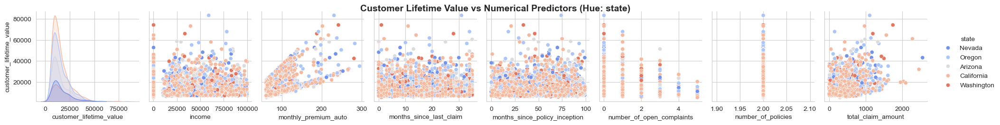

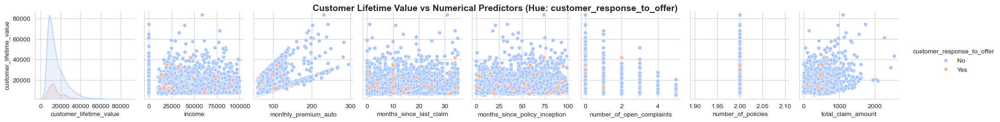

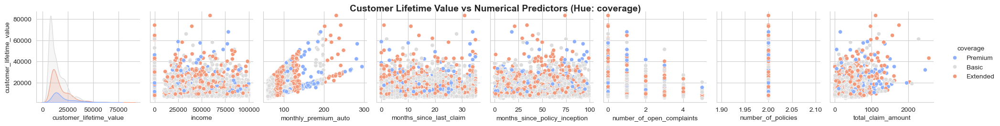

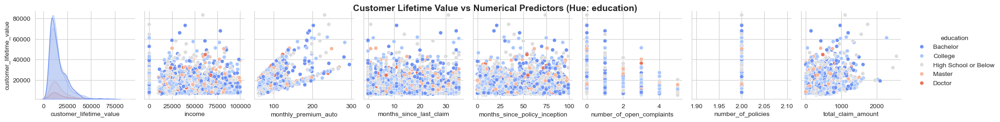

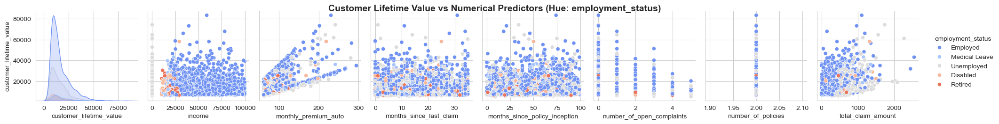

...

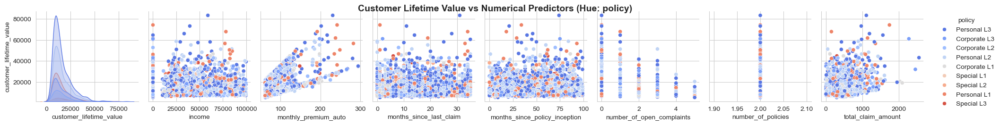

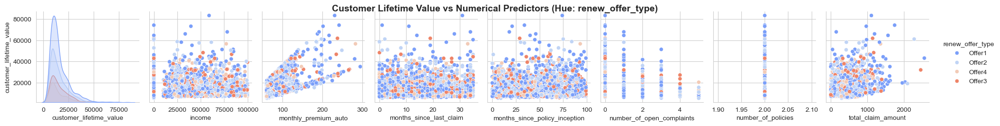

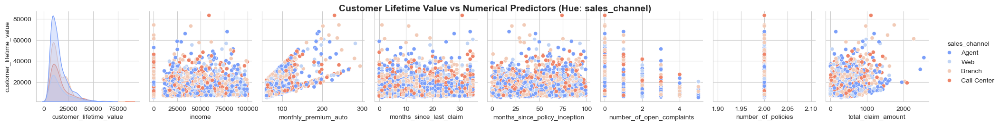

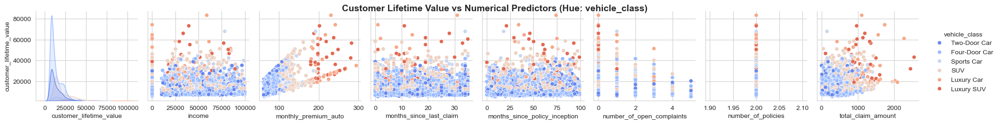

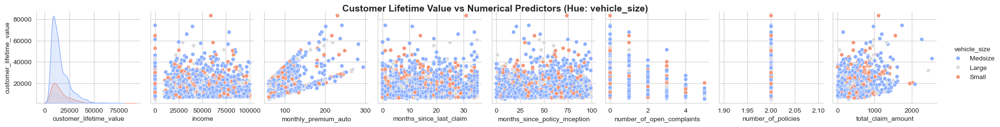

In [34]:
for hue_col in cat_cols:
    fig = sns.pairplot(
        data=clv_df_2pol,
        y_vars=['customer_lifetime_value'],
        kind='scatter',
        hue=hue_col,
        palette='coolwarm'
    )
    fig.fig.suptitle(f'Customer Lifetime Value vs Numerical Predictors (Hue: {hue_col})', 
                     y=1.02, fontsize=14, weight='bold')
    plt.show()

Use Number of Open Complaints as a hue to see if there is any relationship with the stripping in Monthly Premium:

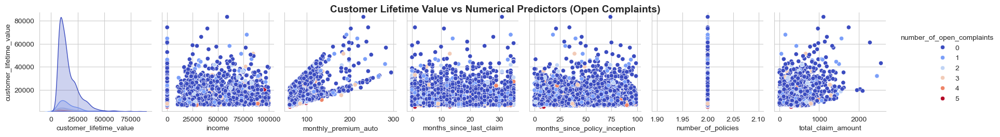

In [35]:
fig = sns.pairplot(
    data=clv_df_2pol,
    y_vars=['customer_lifetime_value'],
    kind='scatter',
    hue='number_of_open_complaints',
    palette='coolwarm'
)
fig.fig.suptitle(f'Customer Lifetime Value vs Numerical Predictors (Open Complaints)', 
              y=1.02, fontsize=14, weight='bold')
plt.show()

Use Total Claim Amount as a hue to see if there is any relationship with the stripping in Monthly Premium:

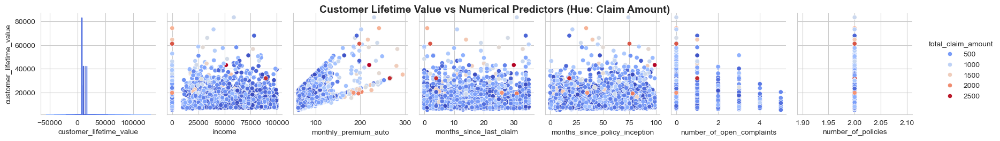

In [36]:
fig = sns.pairplot(
    data=clv_df_2pol,
    y_vars=['customer_lifetime_value'],
    kind='scatter',
    hue='total_claim_amount',
    palette='coolwarm'
)
fig.fig.suptitle(f'Customer Lifetime Value vs Numerical Predictors (Hue: Claim Amount)', 
              y=1.02, fontsize=14, weight='bold')
plt.show()

Full Pair Plot for two policies:

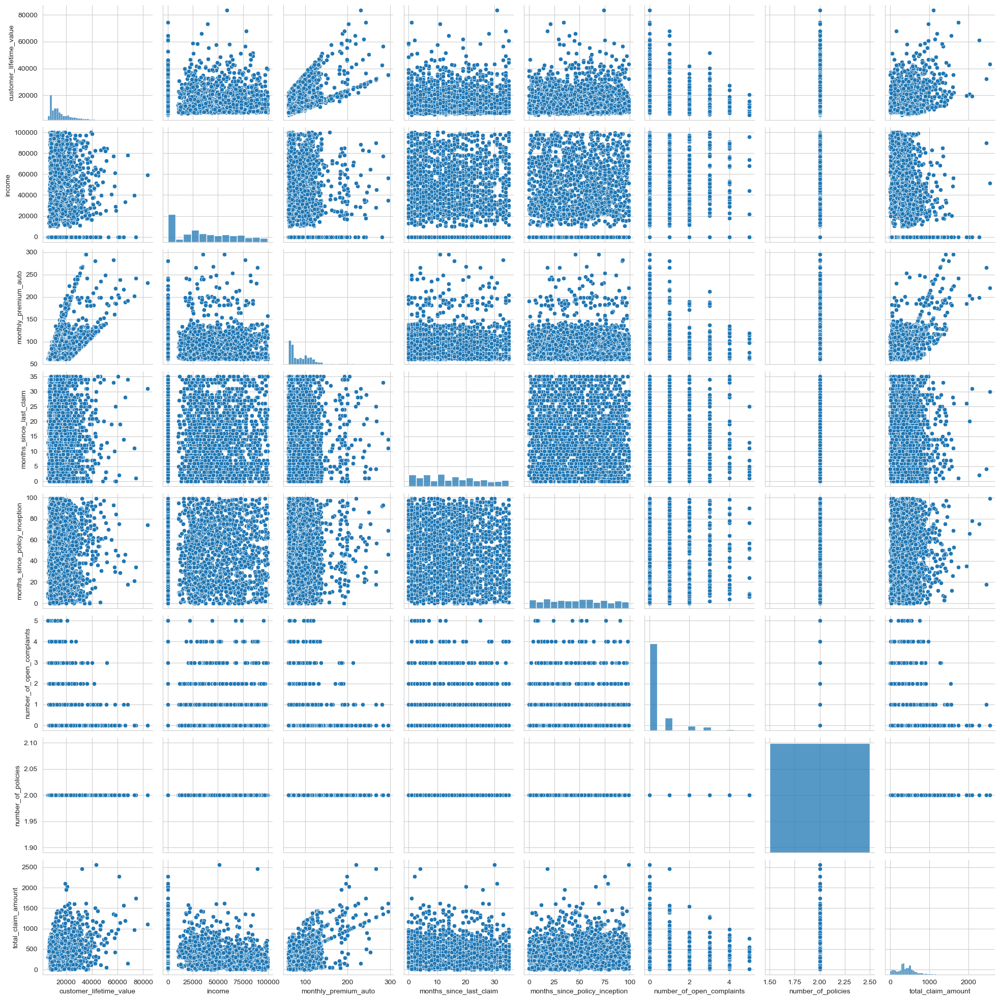

In [37]:
sns.pairplot(clv_df_2pol[num_cols]);
plt.show()

In [38]:
clv_df.to_csv('clean_clv_data.csv', index=False)